## This is an auxiliary notebook to support the main analysis in the Heatwave-Dhaka_BD repository.

In [22]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Load your dataset
df = pd.read_csv('data/1972_2024_Heatwave_Daily.csv')

# Rename columns for clarity
df.rename(columns={
    'timestamp': 'Date',
    'Dhaka Temperature [2 m elevation corrected]': 'Temp_Avg',
    'Dhaka Temperature [2 m elevation corrected].1': 'Temp_Min',
    'Dhaka Temperature [2 m elevation corrected].2': 'Temp_Max',
    'Dhaka Precipitation Total': 'Precipitation',
    'Dhaka Relative Humidity [2 m]': 'Humidity_Avg',
    'Dhaka Relative Humidity [2 m].1': 'Humidity_Min',
    'Dhaka Relative Humidity [2 m].2': 'Humidity_Max',
    'Dhaka Wind Gust': 'WindGust_Max',
    'Dhaka Wind Gust.1': 'WindGust_Avg',
    'Dhaka Wind Gust.2': 'WindGust_Min',
    'Dhaka Wind Speed [10 m]': 'WindSpeed_Avg',
    'Dhaka Wind Speed [10 m].1': 'WindSpeed_Min',
    'Dhaka Cloud Cover Total': 'CloudCover',
    'Dhaka Sunshine Duration': 'Sunshine',
    'Dhaka Shortwave Radiation': 'Radiation_Shortwave',
    'Dhaka Longwave Radiation': 'Radiation_Longwave',
    'Dhaka UV Radiation': 'Radiation_UV',
    'Dhaka Direct Shortwave Radiation': 'Radiation_Shortwave_Direct',
    'Dhaka Mean Sea Level Pressure [MSL]': 'Pressure_MSL_Avg',
    'Dhaka Mean Sea Level Pressure [MSL].1': 'Pressure_MSL_Min',
    'Dhaka Mean Sea Level Pressure [MSL].2': 'Pressure_MSL_Max',
    'Dhaka Evapotranspiration': 'Evapotranspiration',
    'Dhaka Vapor Pressure Deficit [2 m]': 'VPD_Avg',
    'Dhaka Vapor Pressure Deficit [2 m].1': 'VPD_Min',
    'Dhaka Vapor Pressure Deficit [2 m].2': 'VPD_Max',
    'Dhaka Soil Temperature [0-7 cm down]': 'SoilTemp_Avg',
    'Dhaka Soil Temperature [0-7 cm down].1': 'SoilTemp_Min',
    'Dhaka Soil Temperature [0-7 cm down].2': 'SoilTemp_Max',
    'Dhaka Soil Moisture [0-7 cm down]': 'SoilMoisture_Avg',
    'Dhaka Soil Moisture [0-7 cm down].1': 'SoilMoisture_Min',
    'Dhaka Soil Moisture [0-7 cm down].2': 'SoilMoisture_Max'
}, inplace=True)

# Save the updated DataFrame (optional)
df.to_csv('data/1972_2024_Heatwave_Daily_renamed.csv', index=False)

In [23]:
# Generate Summary of the dataset
summary = df.describe()

summary_t = summary.drop(columns=['Date'], errors='ignore').T
summary_t['count'] = summary_t['count'].astype(int)
summary_t.round(2)

,count,mean,std,min,25%,50%,75%,max
Temp_Avg,19316,30.14,3.35,16.33,28.03,30.69,32.45,40.20
Temp_Min,19316,21.61,5.24,6.45,17.16,23.77,25.99,29.50
Temp_Max,19316,25.48,4.17,10.64,22.39,27.00,28.66,34.04
Precipitation,19315,5.33,10.51,0.00,0.00,0.60,6.70,261.10
Humidity_Avg,19316,94.88,3.12,63.63,93.52,95.33,96.85,100.14
Humidity_Min,19316,57.83,15.68,13.76,45.05,60.04,70.47,95.04
Humidity_Max,19316,79.06,8.40,42.20,74.35,80.57,85.00,97.49
WindGust_Max,19315,28.39,9.62,12.24,20.88,26.28,34.56,124.56
WindGust_Avg,19315,10.99,6.23,1.08,6.48,9.36,13.68,74.88
WindGust_Min,19315,19.10,7.53,6.90,13.34,16.70,23.75,94.41


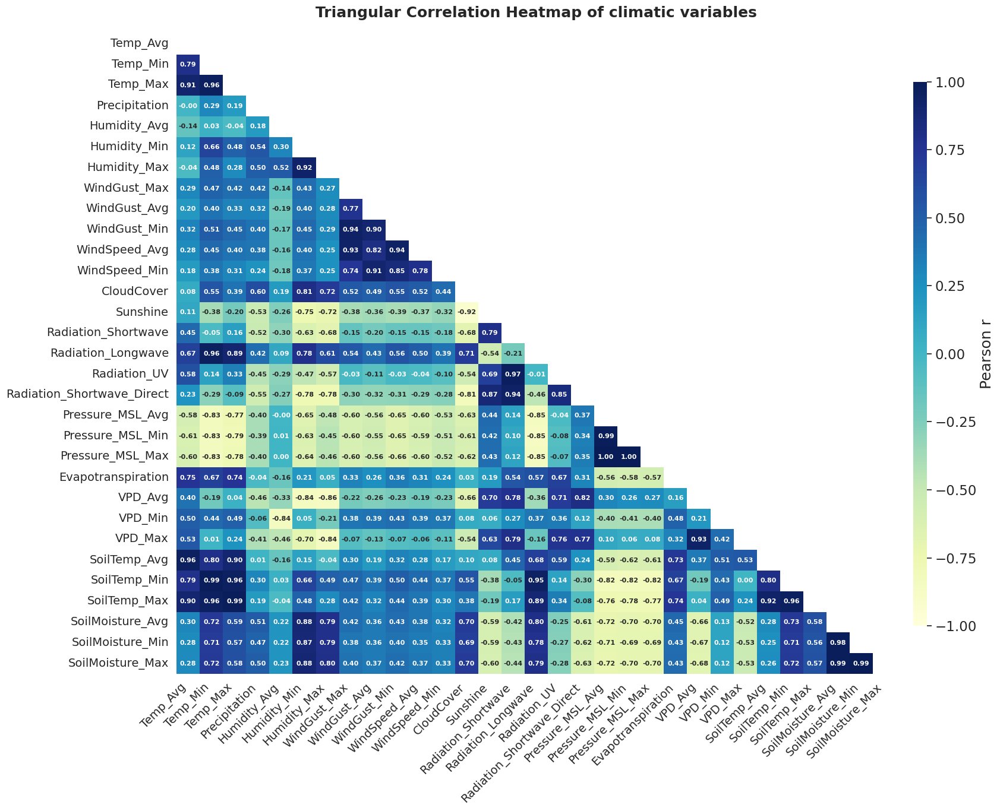

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numeric columns from df (excluding 'Date')
numeric_df = df.select_dtypes(include='number')

# Calculate the correlation matrix
corr = numeric_df.corr()

# Create a mask for the upper triangle
import numpy as np
mask = np.triu(np.ones_like(corr, dtype=bool))

# Further improved correlation heatmap for maximum visibility
plt.figure(figsize=(18, 14))
sns.set_theme(font_scale=1.5)

ax = sns.heatmap(
    corr,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",
    vmin=-1,
    vmax=1,
    linewidths=2,
    linecolor='None',
    annot_kws={"size": 8, "weight": "bold"},
    cbar_kws={"label": "Pearson r", "shrink": 0.85, "orientation": "vertical", "pad": 0.02, "aspect": 40, "drawedges": False}
)

# Remove the empty grid and empty squares with no values by hiding the masked cells
for _, spine in ax.spines.items():
    spine.set_visible(False)
ax.set_facecolor('white')

plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(rotation=0, fontsize=14)

plt.title("Triangular Correlation Heatmap of climatic variables", fontsize=18, fontweight='bold', pad=20)
plt.grid(False)  # Turn off the grid
plt.tight_layout()
plt.show()

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd

def triangular_pairplot_colorful(
    df,
    vars=None,
    height=2.8,
    palette="tab10",
    alpha=0.45,
    s=18,
    font_scale=1.2,
    title="Triangular Pairplot (scatter lower; KDE diag)"
):
    # 1) Prepare numeric data
    if vars is None:
        numeric_df = df.select_dtypes(include="number").copy()
        vars = list(numeric_df.columns)
    else:
        numeric_df = df[vars].select_dtypes(include="number").copy()

    # 2) Theme
    sns.set_theme(style="white", font_scale=font_scale, rc={"axes.grid": False})

    # 3) Grid
    g = sns.PairGrid(
        numeric_df,
        vars=vars,
        corner=True,
        height=height,
        despine=False
    )

    # 4) Colors
    pal = sns.color_palette(palette, n_colors=max(10, len(vars)))
    def cell_color(i, j):
        return pal[(i * 3 + j * 5) % len(pal)]

    # 5) Diagonal KDE with fallback
    def _diag_kde(x, color=None, **kwargs):
        x = pd.Series(x).dropna()
        if x.nunique() < 2:  # KDE cannot be computed
            sns.histplot(x=x, bins=20, stat="density",
                         element="step", fill=False,
                         color=color, linewidth=1.5, **kwargs)
        else:
            sns.kdeplot(x=x, fill=True, linewidth=2.0,
                        color=color, bw_adjust=0.9, **kwargs)

    # Map the diagonal with a color per variable
    if g.diag_axes is not None:
        for i, var in enumerate(vars):
            if i < len(g.diag_axes) and g.diag_axes[i] is not None:
                ax = g.diag_axes[i]
                _diag_kde(numeric_df[var], color=pal[i % len(pal)], ax=ax)

    # 6) Lower triangle scatter
    for i, yvar in enumerate(g.y_vars):
        for j, xvar in enumerate(g.x_vars[:i]):
            ax = g.axes[i, j]
            if ax is not None:
                sns.scatterplot(
                    data=numeric_df,
                    x=xvar, y=yvar,
                    s=s, alpha=alpha,
                    color=cell_color(i, j),
                    edgecolor="none",
                    ax=ax
                )
                ax.set_facecolor("white")

    # 7) Axis labels
    for ax in g.figure.axes:
        for lbl in ax.get_xticklabels():
            lbl.set_rotation(45)
            lbl.set_fontsize(24)
            lbl.set_fontweight("bold")
        for lbl in ax.get_yticklabels():
            lbl.set_fontsize(24)
            lbl.set_fontweight("bold")

    # 8) Legend
    handles = [
        Line2D([], [], marker="o", color="w",
               markerfacecolor=pal[0], markersize=8,
               label="Scatter (variable pairs)"),
        Line2D([], [], color=pal[1], lw=2,
               label="KDE (distribution, diagonal)")
    ]
    g.figure.legend(handles=handles, loc="upper right",
                 frameon=False, title="Plot Types", fontsize=12)

    # 9) Title and layout
    g.figure.suptitle(title, fontsize=36, fontweight="bold", y=1.02)
    g.figure.tight_layout(rect=(0, 0, 1, 0.98))

    return g

# Usage (your same vars list):
g = triangular_pairplot_colorful(
    df,
    vars=[
        "Temp_Avg", "Temp_Min", "Temp_Max", "Precipitation",
        "Humidity_Avg", "Humidity_Min", "Humidity_Max",
        "WindGust_Max", "WindGust_Avg", "WindGust_Min",
        "WindSpeed_Avg", "WindSpeed_Min",
        "CloudCover", "Sunshine",
        "Radiation_Shortwave", "Radiation_Longwave", "Radiation_UV",
        "Radiation_Shortwave_Direct",
        "Pressure_MSL_Avg", "Pressure_MSL_Min", "Pressure_MSL_Max",
        "Evapotranspiration", "VPD_Avg", "VPD_Min", "VPD_Max",
        "SoilTemp_Avg", "SoilTemp_Min", "SoilTemp_Max",
        "SoilMoisture_Avg", "SoilMoisture_Min", "SoilMoisture_Max"
    ],
    title="Triangular Pairplot of Climatic Variables"
)
plt.show()